
# **Deep Learning Lab - CNNs**

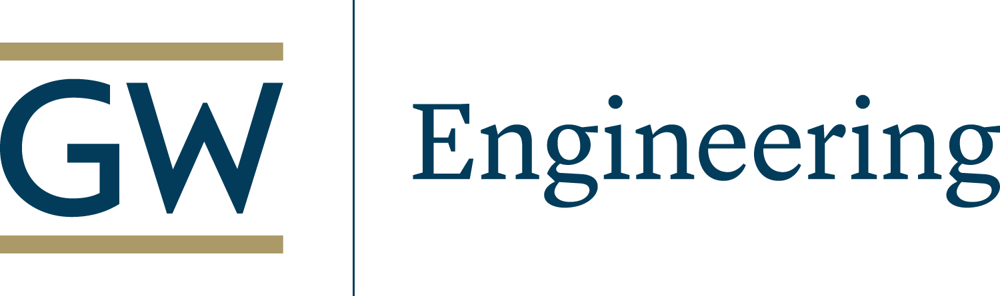

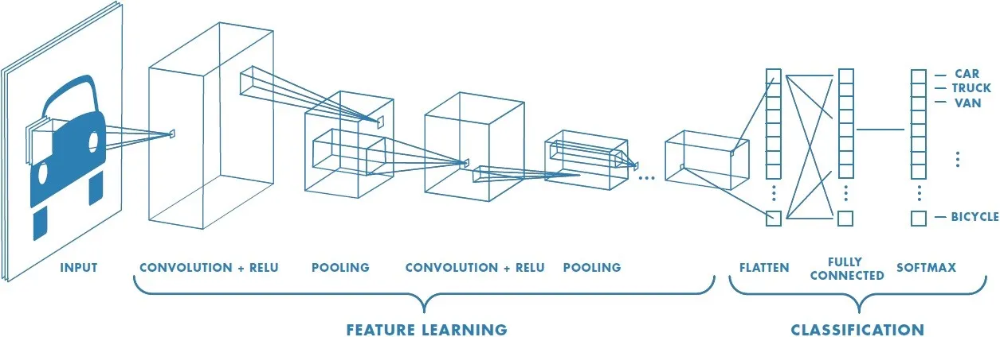

https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53

In [ ]:
#Load the libraries - Load them all here - not sprinkled throughout the notebook.
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder

from sklearn.model_selection import GridSearchCV

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, recall_score, precision_score, f1_score

import warnings
warnings.filterwarnings('ignore') #ignore warnings

%load_ext tensorboard

In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, Nadam, RMSprop



In [ ]:
print(tf.__version__)

2.17.0


In [ ]:
!nvidia-smi

Tue Oct  1 01:07:28 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   63C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
mnist = tf.keras.datasets.mnist
(x_train, y_train), (x_test, y_test) = mnist.load_data()

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
df_mnist_train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/data/mnist_train.csv')
df_mnist_test = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/data/mnist_test.csv')

In [ ]:
df_mnist_train.head()

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
print(df_mnist_train.iloc[0])

label    5
1x1      0
1x2      0
1x3      0
1x4      0
        ..
28x24    0
28x25    0
28x26    0
28x27    0
28x28    0
Name: 0, Length: 785, dtype: int64


### **DATA UNDERSTANDING**

In [ ]:
df_mnist_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Columns: 785 entries, label to 28x28
dtypes: int64(785)
memory usage: 359.3 MB


In [ ]:
df_mnist_train.describe()

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
count,60000.000000,60000.0,60000.0,60000.0,60000.0,60000.0,60000.0,60000.0,60000.0,60000.0,...,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.0000,60000.0,60000.0,60000.0,60000.0
mean,4.453933,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.200433,0.088867,0.045633,0.019283,0.015117,0.0020,0.0,0.0,0.0,0.0
std,2.889270,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6.042472,3.956189,2.839845,1.686770,1.678283,0.3466,0.0,0.0,0.0,0.0
min,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.0
25%,2.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.0
50%,4.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.0
75%,7.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.0
max,9.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,254.000000,254.000000,253.000000,253.000000,254.000000,62.0000,0.0,0.0,0.0,0.0


In [ ]:
na_sum = df_mnist_train.isna().sum()
if na_sum.sum() == 0:
    print("There are no missing values")
else:
    print("There are missing values")

There are no missing values


label
1    6742
7    6265
3    6131
2    5958
9    5949
0    5923
6    5918
8    5851
4    5842
5    5421
Name: count, dtype: int64


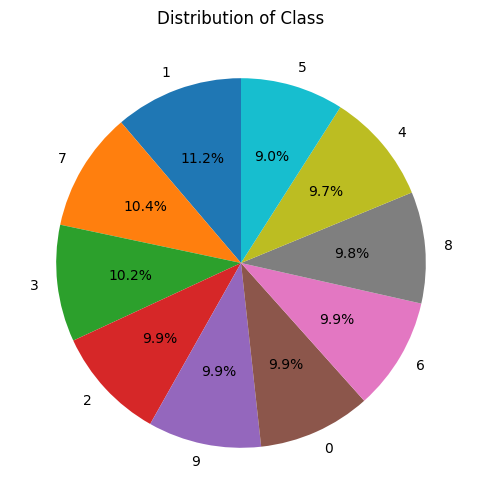

In [ ]:
class_counts = df_mnist_train['label'].value_counts()
print(class_counts)
plt.figure(figsize=(8, 6))
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Class')
plt.show()


Very balanced

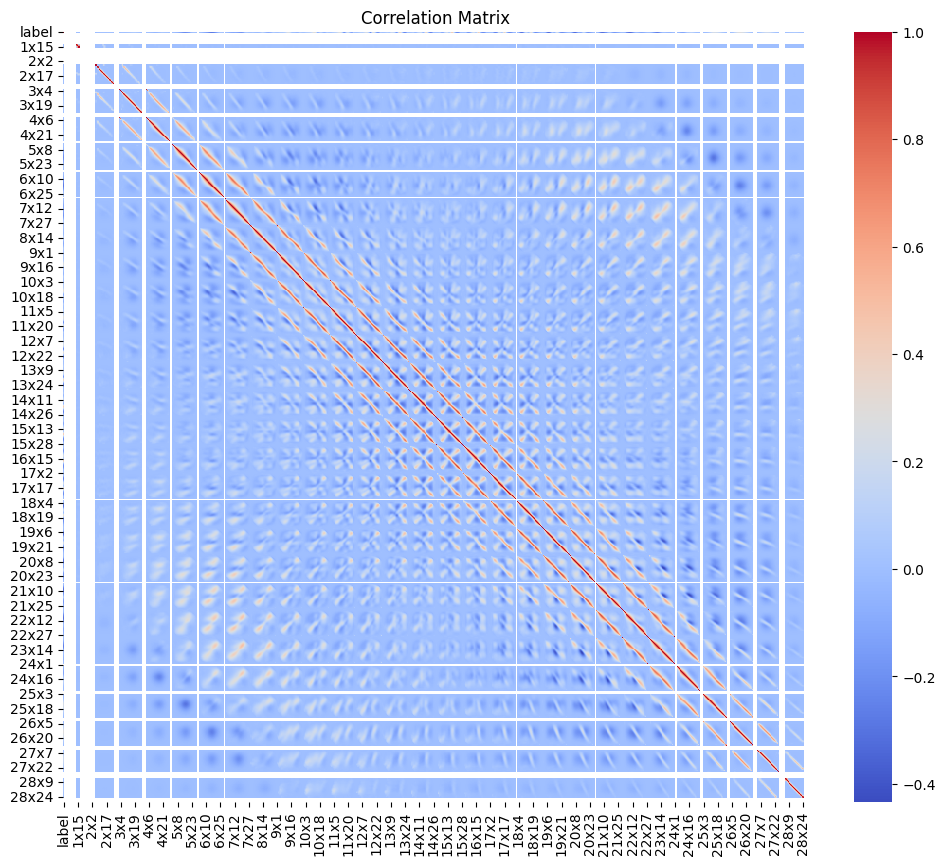

In [ ]:
# prompt: correlation heatmap

correlation_matrix = df_mnist_train.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()


### **DATA PREPARATION**

In [ ]:
x_train = df_mnist_train.drop('label', axis=1)
y_train = df_mnist_train['label']
x_test = df_mnist_test.drop('label', axis=1)
y_test = df_mnist_test['label']

In [ ]:
train_array = x_train.to_numpy()
test_array = x_test.to_numpy()

In [ ]:
test_array.shape

(10000, 784)

In [ ]:
test_array = test_array.reshape(10000, 28, 28,1)

In [ ]:
train_array.shape

(60000, 784)

In [ ]:
train_array = train_array.reshape(60000, 28, 28,1)

In [ ]:
# x_train=x_train.reshape(x_train.shape[0], x_train.shape[1], x_train.shape[2], 1)
# x_train=x_train / 255.0
# x_test = x_test.reshape(x_test.shape[0], x_test.shape[1], x_test.shape[2], 1)
# x_test=x_test/255.0

In [ ]:
x_train=x_train / 255.0
x_test=x_test/255.0

In [ ]:
test_array.shape

(10000, 28, 28, 1)

In [ ]:
train_array.shape

(60000, 28, 28, 1)

In [ ]:
y_train = tf.one_hot(y_train.astype(np.int32), depth=10)
y_test = tf.one_hot(y_test.astype(np.int32), depth=10)

In [ ]:
y_train[0]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0.], dtype=float32)>

tf.Tensor([0. 0. 0. 0. 0. 0. 0. 0. 0. 1.], shape=(10,), dtype=float32)


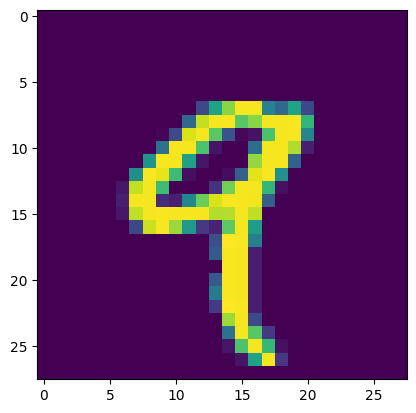

In [ ]:
plt.imshow(train_array[4][:,:,0])
print(y_train[4])

<Axes: >

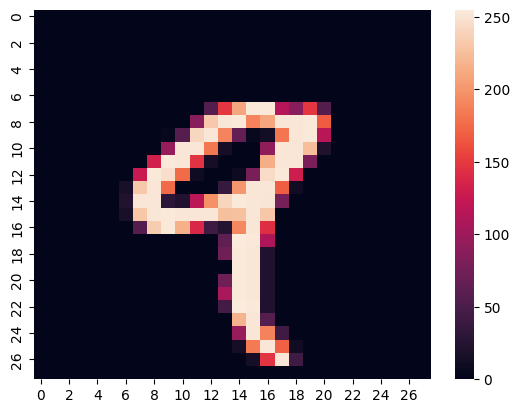

In [ ]:
sns.heatmap(train_array[4][:,:,0])

### **Model Development**

In [ ]:
batch_size = 32
num_classes = 10
epochs = 10

input_shape = (28, 28, 1)

optimizer = Adam(learning_rate=0.001)

In [ ]:
log_dir = "logs/fit/"  # Adjust the directory as needed
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (5,5), padding='same', activation='relu', input_shape=input_shape),
    tf.keras.layers.Conv2D(32, (5,5), padding='same', activation='relu'),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(64, (3,3), padding='same', activation='relu'),
    tf.keras.layers.Conv2D(64, (3,3), padding='same', activation='relu'),
    tf.keras.layers.MaxPool2D(strides=(2,2)),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['acc'])

In [ ]:
# Define early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',   # Monitor validation loss
    patience=3,           # Number of epochs with no improvement after which training will stop
    min_delta=0.001,      # Minimum change to qualify as an improvement
    mode='min',           # 'min' because we're looking for the minimum validation loss
    restore_best_weights=True  # Restore model weights from the epoch with the best validation loss
)

In [ ]:
from sys import version
# Train the model with early stopping
history = model.fit(
    train_array, y_train,
    validation_split=0.2,
    epochs=epochs,
    batch_size=batch_size,
    verbose = 1,
    callbacks=[early_stopping, tensorboard_callback]
)

Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - acc: 0.7710 - loss: 0.9364 - val_acc: 0.9815 - val_loss: 0.0628
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - acc: 0.9555 - loss: 0.1479 - val_acc: 0.9859 - val_loss: 0.0496
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - acc: 0.9677 - loss: 0.1123 - val_acc: 0.9836 - val_loss: 0.0547
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - acc: 0.9717 - loss: 0.0997 - val_acc: 0.9858 - val_loss: 0.0478
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - acc: 0.9737 - loss: 0.0993 - val_acc: 0.9848 - val_loss: 0.0510
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - acc: 0.9790 - loss: 0.0809 - val_acc: 0.9886 - val_loss: 0.0480
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - acc: 0.9758 - loss: 0.0877 - val_acc: 0.9895 - val_loss: 0.0393
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - acc: 0.9777 - loss: 0.0821 - val_acc: 0.9869 - val_loss: 0.0514
Epoch 9/10
1500/1500 ━━━━━━━━━━━━━━━━

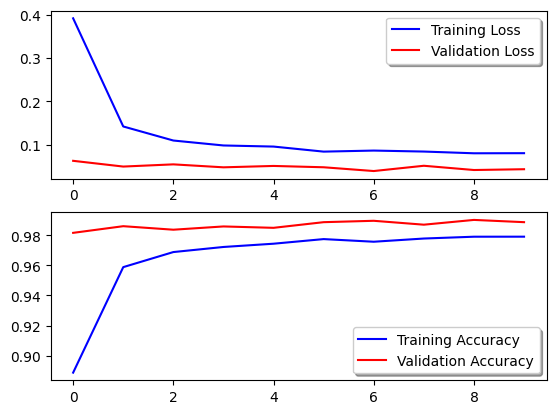

In [ ]:
fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='b', label="Training Loss")
ax[0].plot(history.history['val_loss'], color='r', label="Validation Loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['acc'], color='b', label="Training Accuracy")
ax[1].plot(history.history['val_acc'], color='r',label="Validation Accuracy")
legend = ax[1].legend(loc='best', shadow=True)

In [ ]:
test_loss, test_acc = model.evaluate(test_array, y_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - acc: 0.9881 - loss: 0.0404


In [ ]:
# Predict the values from the testing dataset
Y_pred = model.predict(test_array)
# Convert predictions classes to one hot vectors
Y_pred_classes = np.argmax(Y_pred,axis = 1)
# Convert testing observations to one hot vectors
Y_true = np.argmax(y_test,axis = 1)
# compute the confusion matrix
confusion_mtx = tf.math.confusion_matrix(Y_true, Y_pred_classes)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


<Axes: >

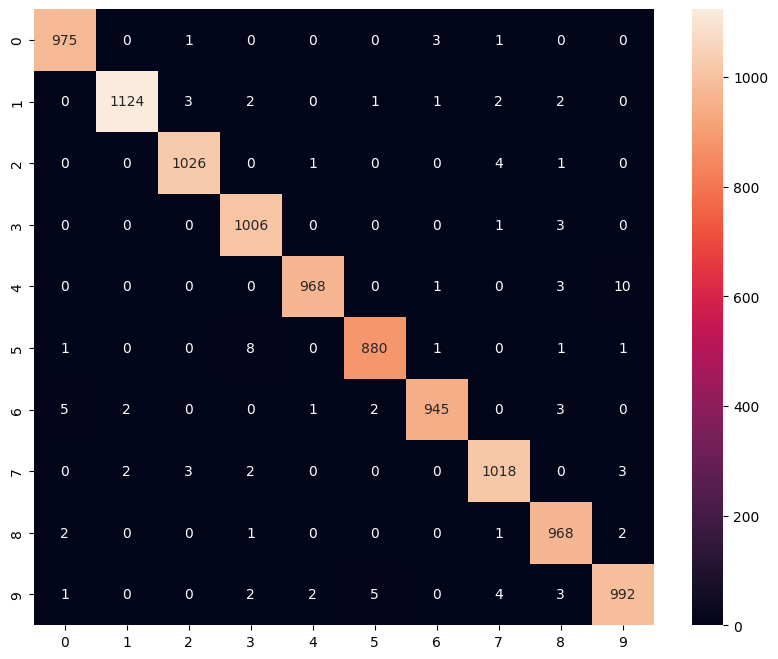

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx, annot=True, fmt='g')

In [ ]:
accuracy = accuracy_score(Y_true, Y_pred_classes)
recall = recall_score(Y_true, Y_pred_classes, average='weighted')
precision = precision_score(Y_true, Y_pred_classes, average='weighted')
f1 = f1_score(Y_true, Y_pred_classes, average='weighted')

In [ ]:
print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"Precision: {precision}")
print(f"F1 Score: {f1}")

Accuracy: 0.9902
Recall: 0.9902
Precision: 0.9902243348943625
F1 Score: 0.9902007046260626


In [ ]:
%tensorboard --logdir logs/fit


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
batch_size = 32
num_classes = 10
epochs = 10

train_array = train_array.reshape(60000, 28, 28)

optimizer = Adam(learning_rate=0.001)
log_dir = "logs/fit/"  # Adjust the directory as needed
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['acc'])
# Define early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',   # Monitor validation loss
    patience=3,           # Number of epochs with no improvement after which training will stop
    min_delta=0.001,      # Minimum change to qualify as an improvement
    mode='min',           # 'min' because we're looking for the minimum validation loss
    restore_best_weights=True  # Restore model weights from the epoch with the best validation loss
)
# Train the model with early stopping
history = model.fit(
    train_array, y_train,
    validation_split=0.2,
    epochs=epochs,
    batch_size=batch_size,
    verbose = 1,
    callbacks=[early_stopping, tensorboard_callback]
)


Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - acc: 0.8006 - loss: 5.7249 - val_acc: 0.9109 - val_loss: 0.4902
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - acc: 0.9228 - loss: 0.3868 - val_acc: 0.9323 - val_loss: 0.3068
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - acc: 0.9405 - loss: 0.2402 - val_acc: 0.9252 - val_loss: 0.3222
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - acc: 0.9448 - loss: 0.2161 - val_acc: 0.9451 - val_loss: 0.2212
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - acc: 0.9540 - loss: 0.1746 - val_acc: 0.9452 - val_loss: 0.2156
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - acc: 0.9563 - loss: 0.1609 - val_acc: 0.9392 - val_loss: 0.2435
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - acc: 0.9662 - loss: 0.1218 - val_acc: 0.9613 - val_loss: 0.1633
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - acc: 0.9709 - loss: 0.1063 - val_acc: 0.9628 - val_loss: 0.1532
Epoch 9/10
1500/1500 ━━━━━━━━━━━━━━━━━━━

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - acc: 0.9591 - loss: 0.1717
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Accuracy: 0.9635
Recall: 0.9635
Precision: 0.963708323898791
F1 Score: 0.9635134848080019


<IPython.core.display.Javascript object>

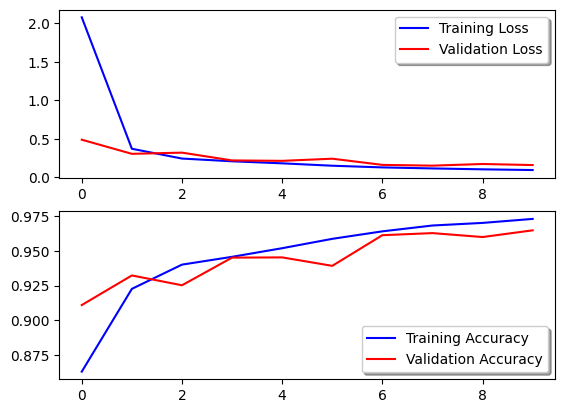

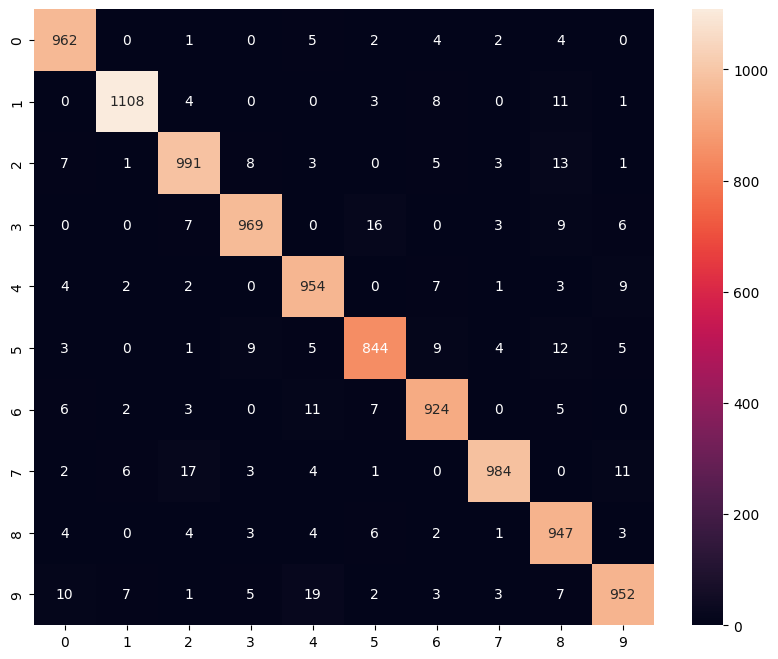

In [ ]:
test_array = test_array.reshape(10000, 28, 28)

fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='b', label="Training Loss")
ax[0].plot(history.history['val_loss'], color='r', label="Validation Loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['acc'], color='b', label="Training Accuracy")
ax[1].plot(history.history['val_acc'], color='r',label="Validation Accuracy")
legend = ax[1].legend(loc='best', shadow=True)
test_loss, test_acc = model.evaluate(test_array, y_test)
# Predict the values from the testing dataset
Y_pred = model.predict(test_array)
# Convert predictions classes to one hot vectors
Y_pred_classes = np.argmax(Y_pred,axis = 1)
# Convert testing observations to one hot vectors
Y_true = np.argmax(y_test,axis = 1)
# compute the confusion matrix
confusion_mtx = tf.math.confusion_matrix(Y_true, Y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx, annot=True, fmt='g')
accuracy = accuracy_score(Y_true, Y_pred_classes)
recall = recall_score(Y_true, Y_pred_classes, average='weighted')
precision = precision_score(Y_true, Y_pred_classes, average='weighted')
f1 = f1_score(Y_true, Y_pred_classes, average='weighted')
print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"Precision: {precision}")
print(f"F1 Score: {f1}")
%tensorboard --logdir logs/fit
